In [1]:
#!pip uninstall tensorflow

In [2]:
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

2.12.0



# **Implementing CNN Model**

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import SeparableConv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense

class FireDetectionNet:
	@staticmethod
	def build(width, height, depth, classes):
		model = Sequential()
		inputShape = (height, width, depth)
		chanDim = -1

	
		model.add(SeparableConv2D(16, (7, 7), padding="same",
			input_shape=inputShape))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		model.add(SeparableConv2D(32, (3, 3), padding="same"))   # CONV => RELU => POOL
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		model.add(SeparableConv2D(64, (3, 3), padding="same"))   # CONV => RELU => POOL
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
	
		model.add(SeparableConv2D(64, (3, 3), padding="same"))   # (CONV => RELU) * 2 => POOL
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		#FC => RELU layers

		model.add(Flatten())
		model.add(Dense(128))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
		model.add(Dropout(0.5))
	
		model.add(Dense(128))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
		model.add(Dropout(0.5))

		model.add(Dense(classes))
		model.add(Activation("softmax"))

		return model

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
FIRE_PATH = '/content/drive/My Drive/Fire and Smoke DATASET/Fire Dataset'
NON_FIRE_PATH = '/content/drive/My Drive/Fire and Smoke DATASET/Non-Fire Dataset'

CLASSES = ["Non-Fire", "Fire"]

#size of the training and testing split
TRAIN_SPLIT = 0.70
TEST_SPLIT = 0.30

#initial learning rate, batch size, and number of epochs
INIT_LR = 1e-2
BATCH_SIZE = 32
NUM_EPOCHS = 120

SAMPLE_SIZE = 50

# **Prepreocessing and Exploring dataset**

In [ ]:
import matplotlib
matplotlib.use("Agg")

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import cv2
import sys

def load_dataset(datasetPath):
	imagePaths = list(paths.list_images(datasetPath))
	data = []

 #loaded the image and resize it to be a fixed 128x128 pixels
	for imagePath in imagePaths:
		image = cv2.imread(imagePath)
		image = cv2.resize(image, (128, 128)) 
		data.append(image)

	return np.array(data, dtype="float32")

print("[INFO] loading data...")
fireData = load_dataset( FIRE_PATH)
nonFireData = load_dataset( NON_FIRE_PATH)
print("[INFO] Completed")

[INFO] loading data...
[INFO] Completed


In [ ]:
print(fireData.shape)
print(nonFireData.shape)

(1315, 128, 128, 3)
(2688, 128, 128, 3)


In [ ]:
fireLabels = np.ones((fireData.shape[0],))
nonFireLabels = np.zeros((nonFireData.shape[0],))

data = np.vstack([fireData, nonFireData]) #stacking the fire data with the non-fire data
labels = np.hstack([fireLabels, nonFireLabels])

data /= 255

labels = to_categorical(labels, num_classes=2) # perform one-hot encoding on the labels and account for skew in the labeled data
classTotals = labels.sum(axis=0)
classWeight = classTotals.max() / classTotals

In [ ]:
print(data.shape)
print(labels.shape)
print(labels[1:])
print(classTotals)

(4003, 128, 128, 3)
(4003, 2)
[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]
[2688. 1315.]


In [ ]:
# created the training and testing split
(trainX, testX, trainY, testY) = train_test_split(data, labels,
	test_size= TEST_SPLIT, random_state=42)

In [ ]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(testY.shape)

(2802, 128, 128, 3)
(2802, 2)
(1201, 128, 128, 3)
(1201, 2)


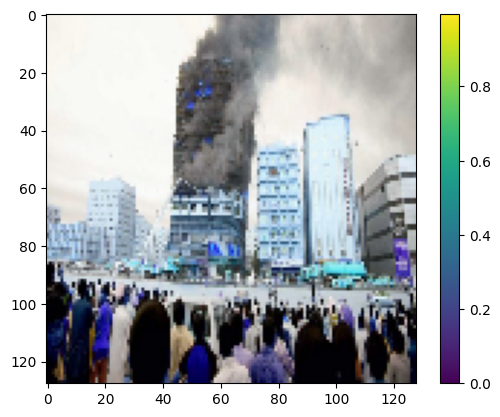

In [ ]:
# Exploring the dataset
%matplotlib inline 
plt.figure()
plt.imshow(trainX[1])
plt.colorbar()
plt.grid(False)
plt.show()

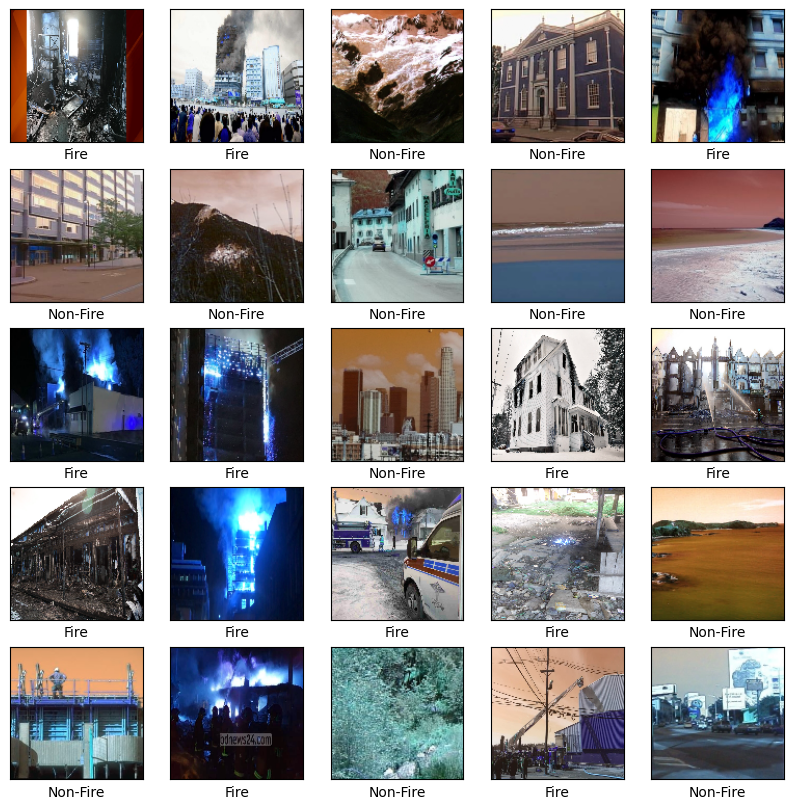

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(trainX[i], cmap=plt.cm.binary)
    if trainY[i][0] == 1:
      plt.xlabel("Non-Fire")
    else:
      plt.xlabel("Fire")

plt.show()

## **Model Training**

In [ ]:
from tensorflow import keras
from tensorflow.keras.callbacks import TensorBoard
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
%load_ext tensorboard
!rm -rf ./logs/ 
%tensorboard --logdir logs/
tensorboard = TensorBoard(log_dir="./logs", histogram_freq=1)

aug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")


print("[INFO] compiling model...")

opt = keras.optimizers.Adam(lr=INIT_LR)
model = FireDetectionNet.build(width=128, height=128, depth=3,
	classes=2)
model.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])


print("[INFO] training network...")
H = model.fit_generator(
	aug.flow(trainX, trainY, batch_size= BATCH_SIZE),
	validation_data=(testX, testY),
	steps_per_epoch=trainX.shape[0] //  BATCH_SIZE,
	epochs= NUM_EPOCHS,
	callbacks=[tensorboard]
	)

print("[INFO] evaluating network...")
predictions = model.predict(testX, batch_size= BATCH_SIZE)
print(classification_report(testY.argmax(axis=1),
	predictions.argmax(axis=1), target_names= CLASSES))





The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

[INFO] compiling model...
[INFO] training network...
Epoch 1/120


<ipython-input-33-06f543df5218>:30: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  H = model.fit_generator(


87/87 [==============================] - 151s 2s/step - loss: 0.6102 - accuracy: 0.7671 - val_loss: 0.9377 - val_accuracy: 0.6570
Epoch 2/120
87/87 [==============================] - 149s 2s/step - loss: 0.4506 - accuracy: 0.8264 - val_loss: 1.3689 - val_accuracy: 0.6570
Epoch 3/120
87/87 [==============================] - 141s 2s/step - loss: 0.4250 - accuracy: 0.8314 - val_loss: 2.4763 - val_accuracy: 0.6570
Epoch 4/120
87/87 [==============================] - 141s 2s/step - loss: 0.3738 - accuracy: 0.8487 - val_loss: 2.5943 - val_accuracy: 0.6570
Epoch 5/120
87/87 [==============================] - 144s 2s/step - loss: 0.3636 - accuracy: 0.8502 - val_loss: 1.8490 - val_accuracy: 0.6570
Epoch 6/120
87/87 [==============================] - 145s 2s/step - loss: 0.3166 - accuracy: 0.8744 - val_loss: 0.9917 - val_accuracy: 0.6636
Epoch 7/120
87/87 [==============================] - 141s 2s/step - loss: 0.2957 - accuracy: 0.8830 - val_loss: 0.3591 - val_accuracy: 0.8485
Epoch 8/120
87/87 

# **Accuracy Plot**

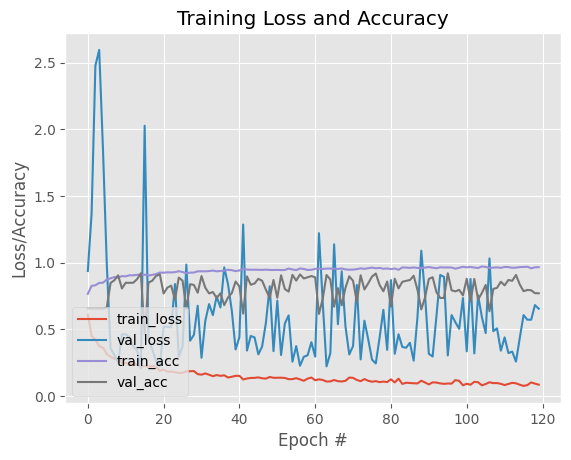

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

N = np.arange(0,  NUM_EPOCHS)
plt.style.use("ggplot")
fig = plt.figure()
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

# **Exploring the Predictions**

In [ ]:
print(predictions.shape)
print(predictions[:1])

(1201, 2)
[[7.2505343e-15 9.9999994e-01]]


In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(testX[i], cmap=plt.cm.binary)
    if testY[i][0] == 1:
      if predictions[i][0] > 0.5:
        plt.xlabel("Non-Fire", color='green')
      else:
        plt.xlabel("Non-Fire", color='red')
    else:
      if predictions[i][1] > 0.5:
        plt.xlabel("Fire", color='green')
      else:
        plt.xlabel("Fire", color='red')

plt.show()

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 separable_conv2d_4 (Separab  (None, 128, 128, 16)     211       
 leConv2D)                                                       
                                                                 
 activation_7 (Activation)   (None, 128, 128, 16)      0         
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 16)       0         
 2D)                                                             
                                                                 
 separable_conv2d_5 (Separab  (None, 64, 64, 32)       688       
 leConv2D)                                            